# General Presentation

## Introduction

This notebook is a demo of the use of ABIDES-Gym for training and testing a RL algorithm.

Details about ABIDES-Gym can be found on [arXiv](https://arxiv.org/pdf/2110.14771.pdf).

We assume the setup instructions in [ReadMe](https://github.com/jpmorganchase/abides-jpmc-public#readme) have been followed prior to running this notebook.

At the moment, ABIDES-Gym offers two trading environments:
- Daily Investor Environment: This environment presents an example of the classic problem wherean investor tries to make money buying and selling a stock through-out a single day. 
- Execution Environment: This environment presents an example of the optimal execution of a parent order problem. 

We will use the [ABIDES-Gym Execution environment](https://github.com/jpmorganchase/abides-jpmc-public/blob/main/abides-gym/abides_gym/envs/markets_execution_environment_v0.py) as an illustration of how to use ABIDES-Gym

## Problem setup 



This environment presents an example of the optimal execution of a parent order problem. The agent has either an initial inventory of the stocks it tries to trade out of or no initial inventory and tries to acquire a target number of shares. The goal is to realize this task while minimizing transaction cost from spreads and market impact. It does so by splitting the parent order into several smaller child orders.


We can define the problem parameters:
- $parentOrderSize$: Total size the agent has to execute (either buy or sell).
- $direction$: direction of the parentOrder (buy or sell).
- $timeWindow$: Time length the agent is given to proceed with parentOrderSize execution.
- $entryPrice$ is the midPrice_t at the beginning of the episode
- $nearTouch_t$ is the highest bidPrice if direction = buy else is the lowest askPrice
- $penalty$: it is a constant penalty per non-executed share at the end of the timeWindow.







## Action Space

The environment allows for three simple actions: "MARKET ORDER", "DO NOTHING" and "LIMIT ORDER". They are defined as follow:
- "MARKET ORDER": the agent places a market order of size $childOrderSize$ in the direction $direction$. (Instruction to buy or sell immediately at the current best available price)
- "LIMIT ORDER": the agent places a limit order of size $childOrderSize$ in the direction $direction$ at the price level $nearTouch_t$. (Buy or sell only at a specified price or better, does not guarantee execution)
- "DO NOTHING": no action is taken.

Before sending a "MARKET ORDER" or a "LIMIT ORDER", the agent will cancel any living order still in the Order Book.

## Reward

$$R_{total} = R_{slippage} + R_{Late Penalty} = R_{slippage} + \lambda \times Quantity_{NotExecuted}$$

with: 

- $ \lambda = penaltyFactor $

We define the step reward (slippage reward componant) as:

$$reward_t= \frac{PNL_t}{parentOrderSize}$$

with:

$$PNL_t = \sum_{o \in O_t } numside\cdot(entryPrice - fillPrice_{o})* quantity_{o}))$$
    
where $numside=1$ if direction is buy else $numside=0$ and $O_t$ is the set of orders executed between step $t-1$ and $t$
    
    
We also define an episode update reward that is computed at the end of the episode. Denoting $O^{episode}$ the set of all orders executed in the episode, it is defined as: 

- 0 if $\sum_{o \in O^{episode}} quantity_{o} = parentOrderSize$
        
- else $|penalty \times ( parentOrderSize - \sum_{o \in O^{episode}} quantity_{o})|$
        

## State Space

The experimental agent perceives the market through the state representation:
        
$$s(t)=( holdingsPct_t, timePct_t, differencePct_t, imbalance5_t, imbalanceAll_t, priceImpact_t, spread_t, directionFeature_t, R^{k}_t)$$
       
where:
- $holdingsPct_t = \frac{holdings_t}{parentOrderSize}$: the execution advancement
- $timePct_t=\frac{t - startingTime}{timeWindow}$: the time advancement
- $differencePct_t = holdingsPct_t - timePct_t$ 
- $priceImpact_t = midPrice_t - entryPrice$
- $imbalance_t=\frac{bids \ volume}{ bids \ volume + asks \ volume}$ using the first 3 levels of the order book. Value is respectively set to $0, 1, 0.5$ for no bids, no asks and empty book.
- $spread_t=bestAsk_t-bestBid_t$
- $directionFeature_t= midPrice_t-lastTransactionPrice_t$
- $R^k_t=(r_t,...,r_{t-k+1})$ series of mid price differences, where $r_{t-i}=mid_{t-i}-mid_{t-i-1}$. It is set to 0 when undefined. By default $k=3$ 
    

# Imports

In [1]:
# Only a few import are needed

import gym
import abides_gym

# Exploration of ABIDES-Gym with Gym runner

## Import the specific environment and set the global seed 

In [2]:
#import abides gym 
env = gym.make(
        "markets-daily_investor-v0",
        background_config="rmsc04"
    )
#set the general seed
env.seed(0)

[0]

## Start the simulation

A simulation is composed of different steps before enabling the Gym agent to act in the environment:
- start the day (00:00:00): No agent can act on the market 
- open the market (09:30:00): Background agents can act on the market
- authorize the Gym agent to act (09:30:00 + N minutes) with N=5 minutes here

The sequence of actions is called by the classic Gym function:
```python
.reset()
```

It returns the state of the market at time 09:30:00 + N minutes.

In [3]:
state = env.reset()

In [4]:
#The state features are as follow
#holdings_pct, time_pct, diff_pct, imbalance_all, imbalance_5, price_impact, spread, directiom, returns

print(state)

[[ 0.       ]
 [ 0.5130776]
 [ 1.       ]
 [-0.5      ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]]


## Agent Action

In [5]:
env.action_space

Discrete(3)

Three actions are available for the agent:
- 0: MKT order of size order_fixed_size
- 1: LMT order of size order_fixed_size
- 2: DO NOTHING

## Step in the Simulation

The step is called by the classic Gym function:
```python
.step(action)
```

It returns the classic:
- the state of the market after taking the action and waiting until the next time step
- the reward obtained during the step 
- whether the environment episode is finished 
- info dictionnary: in default mode, return interesting metrics to track during the training of the agent. May be used in debug_mode for more information passed through

In [6]:
# agent does action 0 
state, reward, done, info = env.step(0)

In [7]:
print('State:')
print(state)
print('-------------------------------------')
print('Reward:')
print(reward)
print('-------------------------------------')
print('Done:')
print(done)
print('-------------------------------------')
print('Info:')
print(info)

State:
[[10.       ]
 [ 0.6331277]
 [ 1.       ]
 [ 0.5      ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]]
-------------------------------------
Reward:
-0.002564102564102564
-------------------------------------
Done:
False
-------------------------------------
Info:
{'remaining_holding': 10, 'remaining_cash': -60, 'action_counter': {'action_0': 1, 'action_1': 0, 'action_2': 0}, 'padded_return': 0.0, 'holdings': 10, 'imbalance': 0.6331276696725202, 'spread': 1, 'direction_feature': 0.5, 'marked_to_market': [1000000, 999990], 'dense_reward': -0.002564102564102564, 'sparse_reward': 0}


# Training an RL algorithm in ABIDES: Example with RLlib

Remark: The notebook demonstrates the use of [RLlib](https://docs.ray.io/en/latest/rllib-algorithms.html) to train the execution agent, however any open-source library or own code will be compatible with ABIDES-Gym. 

## Imports

In [8]:
import ray
from ray import tune

from ray.tune.logger import DEFAULT_LOGGERS
#from ray.tune.integration.wandb import WandbLoggerCallback
#import wandb
from abides_gym.envs.markets_execution_custom_metrics import MyCallbacks

#api_key = wandb.api.api_key
#api_key = 'a4c729e6249cd18aab539e82f7580d5569f66033'

#import os
#os.environ["WANDB_API_KEY"] =  'a4c729e6249cd18aab539e82f7580d5569f66033'
#os.environ["WANDB_MODE"] = "offline"

# Example with custom callbacks and WandB

# Import to register environments
import abides_gym

from ray.tune.registry import register_env
# import env 

from abides_gym.envs.markets_daily_investor_environment_v0 import (
    SubGymMarketsDailyInvestorEnv_v0,
)

/global/home/users/lijieliu/.conda/envs/lijiecapstone/lib/python3.9/site-packages/skimage/io/manage_plugins.py:23: UserWarning: Your installed pillow version is < 8.1.2. Several security issues (CVE-2021-27921, CVE-2021-25290, CVE-2021-25291, CVE-2021-25293, and more) have been fixed in pillow 8.1.2 or higher. We recommend to upgrade this library.
  from .collection import imread_collection_wrapper


## Runner

RLlib enables easy parallelization with for example here the training of a DQN agent in RMSC04 doing a grid_search on the value of the learning rate. 

We also run for 3 different global seeds to verify the robustness of our learning.


**Note**: 
- Would recommend to copy this cell in a python script and let it run in the back with [screen](https://linuxize.com/post/how-to-use-linux-screen/) or [tmux](https://www.hamvocke.com/blog/a-quick-and-easy-guide-to-tmux/) for instance. 
- If you want to execute the cell, turn the execute_cell_flag to True

In [ ]:
execute_cell_flag = True 

if execute_cell_flag:

    ray.shutdown()
    ray.init()

    """
    PPO's default:
    sample_batch_size=200, batch_mode=truncate_episodes, training_batch_size=4000 -> workers collect batches of 200 ts (per worker), then the policy network gets updated using the 4000 last ts (in n minibatch-chunks of 128 (sgd_minibatch_size)).
    
    DQN's default:
    train_batch_size=32, sample_batch_size=4, timesteps_per_iteration=1000 -> workers collect chunks of 4 ts and add these to the replay buffer (of size buffer_size ts), then at each train call, at least 1000 ts are pulled altogether from the buffer (in batches of 32) to update the network.
    """
    
    register_env(
        "markets-daily_investor-v0",
        lambda config: SubGymMarketsDailyInvestorEnv_v0(**config),
    )


    name_xp = "dqn_execution_daily_test_2" #change to your convenience

    tune.run(
        "DQN",
        name=name_xp,
        resume=False,
        stop={"training_iteration": 100},  
        checkpoint_at_end=True,
        checkpoint_freq=20,
        config={
            #"callbacks": MyCallbacks,
            "env": "markets-daily_investor-v0",
            
            "env_config": {
                "background_config":"rmsc04",
                "mkt_close": "16:00:00",
                "timestep_duration": tune.grid_search(["10S","30S", "60S"]),
                "order_fixed_size": tune.grid_search([50,100,200, 500, 1000]),
                "debug_mode": True,
            },
            
            "seed": tune.grid_search([1, 2, 3]),
            "num_gpus": 4,
            "num_workers": 0,
            "hiddens": [50, 20],
            "gamma": 1,
            "lr": tune.grid_search([0.001,0.0001, 0.01]),
            "framework": "torch",
            "observation_filter": "MeanStdFilter",
        },
        
        #callbacks=[
        #        WandbLoggerCallback(
        #            project="abides_markets_execution_abm",
        #            group=name_xp,
        #            api_key=api_key,
        #            log_config=False,
        #            settings=wandb.Settings(silent="True"),
        #        )
        #    ],
    )

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


(pid=17604) /global/home/users/lijieliu/.conda/envs/lijiecapstone/lib/python3.9/site-packages/skimage/io/manage_plugins.py:23: UserWarning: Your installed pillow version is < 8.1.2. Several security issues (CVE-2021-27921, CVE-2021-25290, CVE-2021-25291, CVE-2021-25293, and more) have been fixed in pillow 8.1.2 or higher. We recommend to upgrade this library.
(pid=17604)   from .collection import imread_collection_wrapper
(pid=17604) 2023-02-24 12:57:45,894	INFO dqn.py:141 -- In multi-agent mode, policies will be optimized sequentially by the multi-GPU optimizer. Consider setting simple_optimizer=True if this doesn't work for you.
(pid=17604) 2023-02-24 12:57:45,894	INFO trainer.py:758 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


(pid=17604) 2023-02-24 12:57:51,242	WARNING deprecation.py:38 -- DeprecationWarning: `ReplayBuffer(size)` has been deprecated. Use `ReplayBuffer(capacity)` instead. This will raise an error in the future!
(pid=17604) 2023-02-24 12:57:51,243	WARNING util.py:57 -- Install gputil for GPU system monitoring.


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,,50,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 1000
  custom_metrics: {}
  date: 2023-02-24_12-58-42
  done: false
  episode_len_mean: .nan
  episode_media: {}
  episode_reward_max: .nan
  episode_reward_mean: .nan
  episode_reward_min: .nan
  episodes_this_iter: 0
  episodes_total: 0
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 1000
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.5508086681365967
          mean_q: 0.027781620621681213
          min_q: -0.311157763004303
        mean_td_error: -0.435250461101532
        td_error: "[-6.1947480e-02 -1.3204098e-02 -2.7354211e-01 -6.9177943e-01\n  4.2750239e-01\
          \ -2.3837951e-01 -3.0462897e-01  6.3991547e-04\n -1.2483550e+00  6.2490880e-02\
          \ -2.2692856e-01 -5.1873010e-01\n -9.4417977e-01  1.8223971e-01  7.5822473e-01\
          \ -3.3650512e-01\n -7.0277816e-01 -1.0671827

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,1,51.0445,1000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 2000
  custom_metrics: {}
  date: 2023-02-24_13-00-37
  done: false
  episode_len_mean: .nan
  episode_media: {}
  episode_reward_max: .nan
  episode_reward_mean: .nan
  episode_reward_min: .nan
  episodes_this_iter: 0
  episodes_total: 0
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 1504
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.664047122001648
          mean_q: 0.18237420916557312
          min_q: 0.012449599802494049
        mean_td_error: -0.04641646891832352
        td_error: "[ 0.08030125  0.4938143   0.06804495 -0.17935845 -0.3235815  -0.37409738\n\
          \  0.02097433 -0.11153419 -0.15869635 -0.17696454 -0.13850419  0.02451992\n\
          \  0.04539946 -0.10942847  0.04466784  0.07149327 -0.55785197  0.02770821\n\
          \ -0.43333128  0.21293314 -0.5044789   0.09833229 -

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,2,165.905,2000,nan,nan,nan,nan
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 3000
  custom_metrics: {}
  date: 2023-02-24_13-02-01
  done: false
  episode_len_mean: 2311.0
  episode_media: {}
  episode_reward_max: -2.99980341880342
  episode_reward_mean: -2.99980341880342
  episode_reward_min: -2.99980341880342
  episodes_this_iter: 1
  episodes_total: 1
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 2512
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.37168359756469727
          mean_q: 0.1944979727268219
          min_q: 0.12752476334571838
        mean_td_error: 0.03127651661634445
        td_error: "[ 0.14489956  0.22077675 -0.20613937  0.04362224  0.10796978  0.08425272\n\
          \  0.7523491   0.10408647  0.03546634  0.06752664  0.10274115  0.14427257\n\
          \  0.13286093  0.09684938 -0.02379137  0.06885692 -0.405185   -0.01967707\n\
          \  0.275828

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,3,249.797,3000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 4000
  custom_metrics: {}
  date: 2023-02-24_13-03-40
  done: false
  episode_len_mean: 2311.0
  episode_media: {}
  episode_reward_max: -2.99980341880342
  episode_reward_mean: -2.99980341880342
  episode_reward_min: -2.99980341880342
  episodes_this_iter: 0
  episodes_total: 1
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 3520
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.40500396490097046
          mean_q: 0.2554437220096588
          min_q: 0.08317804336547852
        mean_td_error: -0.04648575931787491
        td_error: "[ 0.0977871  -0.03434619 -0.00985539 -0.05264154 -0.00691605 -0.19221997\n\
          \  0.29076123 -0.03305447 -0.07703145 -0.19562541 -0.09512502  0.04534876\n\
          \ -0.2748911  -0.13806199 -0.02174944 -0.24371195 -0.056537   -0.07793927\n\
          \ -0.10144

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,4,348.847,4000,-2.9998,-2.9998,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 5000
  custom_metrics: {}
  date: 2023-02-24_13-09-15
  done: false
  episode_len_mean: 2311.0
  episode_media: {}
  episode_reward_max: 0.6722905982905997
  episode_reward_mean: -1.1637564102564102
  episode_reward_min: -2.99980341880342
  episodes_this_iter: 1
  episodes_total: 2
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 4528
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.7403050065040588
          mean_q: 0.3712384104728699
          min_q: 0.2202885001897812
        mean_td_error: 0.015123828314244747
        td_error: "[ 0.19301811 -0.09986797 -0.1917708   0.05278856  0.05709302  0.05659556\n\
          \ -0.21421066 -0.0728389   0.09374455  0.11899731  0.09109852 -0.03521511\n\
          \  0.03689728  0.07956028  0.12933452  0.14190581 -0.09917998  0.09588262\n\
          \ -0.1095

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,5,684.004,5000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 6000
  custom_metrics: {}
  date: 2023-02-24_13-14-04
  done: false
  episode_len_mean: 2311.0
  episode_media: {}
  episode_reward_max: 0.6722905982905997
  episode_reward_mean: -1.1637564102564102
  episode_reward_min: -2.99980341880342
  episodes_this_iter: 0
  episodes_total: 2
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 5536
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.45839372277259827
          mean_q: 0.34838584065437317
          min_q: 0.20173212885856628
        mean_td_error: -0.027339864522218704
        td_error: "[-0.06430843  0.04957572 -0.00096013 -0.05887425 -0.06268772 -0.09632301\n\
          \ -0.00649506 -0.08022064 -0.07302576 -0.11610688 -0.38838434  0.1747059\n\
          \ -0.02714449 -0.03408557  0.08239046 -0.10804492  0.04209006  0.15717238\n\
          \  0.1

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,6,973.128,6000,-1.16376,0.672291,-2.9998,2311
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 7000
  custom_metrics: {}
  date: 2023-02-24_13-15-34
  done: false
  episode_len_mean: 2181.6666666666665
  episode_media: {}
  episode_reward_max: 0.6722905982905997
  episode_reward_mean: -2.2866495726495697
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 1
  episodes_total: 3
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 6544
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.5326905250549316
          mean_q: 0.4394921660423279
          min_q: 0.38796475529670715
        mean_td_error: 0.020816341042518616
        td_error: "[-7.67517984e-02  7.65412152e-02  4.07553017e-02  4.76980209e-03\n\
          \  2.72014111e-01  5.22047877e-02 -2.60922790e-01 -4.86780703e-02\n  1.31067395e+00\
          \ -2.66491413e-01 -7.46766627e-02  1.64175361e-01\n -1.00351274e-01 -1.16932690e-02

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,7,1062.86,7000,-2.28665,0.672291,-4.53244,2181.67
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,7,1062.86,7000,-2.28665,0.672291,-4.53244,2181.67
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,7,1062.86,7000,-2.28665,0.672291,-4.53244,2181.67
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,7,1062.86,7000,-2.28665,0.672291,-4.53244,2181.67
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,7,1062.86,7000,-2.28665,0.672291,-4.53244,2181.67
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,7,1062.86,7000,-2.28665,0.672291,-4.53244,2181.67
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,7,1062.86,7000,-2.28665,0.672291,-4.53244,2181.67
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,7,1062.86,7000,-2.28665,0.672291,-4.53244,2181.67
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,7,1062.86,7000,-2.28665,0.672291,-4.53244,2181.67
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,7,1062.86,7000,-2.28665,0.672291,-4.53244,2181.67
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,7,1062.86,7000,-2.28665,0.672291,-4.53244,2181.67
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,7,1062.86,7000,-2.28665,0.672291,-4.53244,2181.67
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 8000
  custom_metrics: {}
  date: 2023-02-24_13-16-33
  done: false
  episode_len_mean: 1815.5
  episode_media: {}
  episode_reward_max: 0.8304615384615199
  episode_reward_mean: -1.5073717948717973
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 1
  episodes_total: 4
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 7552
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.5619404315948486
          mean_q: 0.39560699462890625
          min_q: 0.2091870903968811
        mean_td_error: -0.019207434728741646
        td_error: "[-0.1554079  -0.05194804 -0.01799995 -0.03265059 -0.07821035 -0.06149687\n\
          \ -0.01646772 -0.0728772  -0.02792349  0.0081695   0.05464289 -0.16419524\n\
          \ -0.18914193 -0.01561663  0.09746496 -0.06569231 -0.05996954  0.2675767\n\
          \  0.049

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,8,1122.51,8000,-1.50737,0.830462,-4.53244,1815.5
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 9000
  custom_metrics: {}
  date: 2023-02-24_13-18-20
  done: false
  episode_len_mean: 1783.8
  episode_media: {}
  episode_reward_max: 0.8304615384615199
  episode_reward_mean: -1.423692307692326
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 1
  episodes_total: 5
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 8560
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.417537659406662
          mean_q: 0.24508389830589294
          min_q: 0.009821201674640179
        mean_td_error: -0.238167405128479
        td_error: "[-0.00679228  0.0122458  -0.2857931   0.03161156 -0.12383187  0.17854495\n\
          \ -0.01833433 -0.11095786 -0.16249305 -0.12506789  0.15039065 -6.11505\n \
          \ 0.23407237 -0.11827919 -0.12364477 -0.04822232 -0.16029397 -0.08618075\n\
          \  0.11838877

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,9,1229.47,9000,-1.42369,0.830462,-4.53244,1783.8
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,9,1229.47,9000,-1.42369,0.830462,-4.53244,1783.8
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,9,1229.47,9000,-1.42369,0.830462,-4.53244,1783.8
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,9,1229.47,9000,-1.42369,0.830462,-4.53244,1783.8
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,9,1229.47,9000,-1.42369,0.830462,-4.53244,1783.8
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,9,1229.47,9000,-1.42369,0.830462,-4.53244,1783.8
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,9,1229.47,9000,-1.42369,0.830462,-4.53244,1783.8
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,9,1229.47,9000,-1.42369,0.830462,-4.53244,1783.8
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,9,1229.47,9000,-1.42369,0.830462,-4.53244,1783.8
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,9,1229.47,9000,-1.42369,0.830462,-4.53244,1783.8
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,9,1229.47,9000,-1.42369,0.830462,-4.53244,1783.8
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 10000
  custom_metrics: {}
  date: 2023-02-24_13-19-14
  done: false
  episode_len_mean: 1595.8333333333333
  episode_media: {}
  episode_reward_max: 0.8304615384615199
  episode_reward_mean: -1.592314814814834
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 1
  episodes_total: 6
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 9568
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.667270302772522
          mean_q: 0.3911639451980591
          min_q: -0.08764507621526718
        mean_td_error: 0.013645704835653305
        td_error: "[-0.12513769  0.08350778  0.24218309 -0.11848196  0.6998048  -0.14767823\n\
          \  0.02011734  0.0890213  -0.08541141  0.38802797  0.79875773 -0.4191351\n\
          \ -0.05683404 -0.043672    0.19829589 -0.0876984   0.63958794 -0.8304343\n\
        

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,10,1283.25,10000,-1.59231,0.830462,-4.53244,1595.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,10,1283.25,10000,-1.59231,0.830462,-4.53244,1595.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,10,1283.25,10000,-1.59231,0.830462,-4.53244,1595.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,10,1283.25,10000,-1.59231,0.830462,-4.53244,1595.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,10,1283.25,10000,-1.59231,0.830462,-4.53244,1595.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,10,1283.25,10000,-1.59231,0.830462,-4.53244,1595.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,10,1283.25,10000,-1.59231,0.830462,-4.53244,1595.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,10,1283.25,10000,-1.59231,0.830462,-4.53244,1595.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,10,1283.25,10000,-1.59231,0.830462,-4.53244,1595.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 11000
  custom_metrics: {}
  date: 2023-02-24_13-20-03
  done: false
  episode_len_mean: 1326.25
  episode_media: {}
  episode_reward_max: 3.514179487179442
  episode_reward_mean: -0.8236976495726702
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 2
  episodes_total: 8
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 10576
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.7529842257499695
          mean_q: 0.46771517395973206
          min_q: 0.0800093337893486
        mean_td_error: 0.02714446187019348
        td_error: "[ 0.08046222  0.09337369  0.1029506  -0.20045426  0.2192348  -0.5985967\n\
          \  0.29284817 -0.07518479  1.0006633   0.07418895  0.08970883 -0.01121831\n\
          \ -0.6097665   0.27029282  0.00987867 -0.06551948  0.13586181  0.01202139\n\
          \  0.158

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,11,1331.88,11000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 12000
  custom_metrics: {}
  date: 2023-02-24_13-21-44
  done: false
  episode_len_mean: 1326.25
  episode_media: {}
  episode_reward_max: 3.514179487179442
  episode_reward_mean: -0.8236976495726702
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 0
  episodes_total: 8
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 11584
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 1.1598713397979736
          mean_q: 0.5388052463531494
          min_q: 0.26041674613952637
        mean_td_error: -0.028721611946821213
        td_error: "[ 0.29357022 -0.04181147 -0.27942026 -0.0651865   0.2636707   0.01923496\n\
          \ -0.10466397 -0.6779045  -0.8938409  -0.20856403 -0.20856403  0.21984202\n\
          \  0.3066432   0.22829649 -0.17344487 -0.47205874 -0.19489264 -0.08052403\n\
          \  0.

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,12,1432.58,12000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,12,1432.58,12000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,12,1432.58,12000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,12,1432.58,12000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,12,1432.58,12000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,12,1432.58,12000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,12,1432.58,12000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,12,1432.58,12000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,12,1432.58,12000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,12,1432.58,12000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,12,1432.58,12000,-0.823698,3.51418,-4.53244,1326.25
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 13000
  custom_metrics: {}
  date: 2023-02-24_13-22-36
  done: false
  episode_len_mean: 1246.0
  episode_media: {}
  episode_reward_max: 3.514179487179442
  episode_reward_mean: -0.6559529914530229
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 2
  episodes_total: 10
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 12592
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.5106766819953918
          mean_q: 0.2351352870464325
          min_q: -0.019141830503940582
        mean_td_error: 0.12877732515335083
        td_error: "[ 0.12590703  0.6681396  -0.2439788  -0.5283004  -0.02296886 -0.5089075\n\
          \  0.00955373 -0.39238453  0.8895133  -0.24801806  0.1113815   0.02456939\n\
          \  0.12590703  0.28817314 -0.2163101   0.01477462  0.07398906 -0.21238524\n\
          \  0.1

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,13,1485.15,13000,-0.655953,3.51418,-4.53244,1246
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,13,1485.15,13000,-0.655953,3.51418,-4.53244,1246
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,13,1485.15,13000,-0.655953,3.51418,-4.53244,1246
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,13,1485.15,13000,-0.655953,3.51418,-4.53244,1246
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,13,1485.15,13000,-0.655953,3.51418,-4.53244,1246
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,13,1485.15,13000,-0.655953,3.51418,-4.53244,1246
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,13,1485.15,13000,-0.655953,3.51418,-4.53244,1246
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,13,1485.15,13000,-0.655953,3.51418,-4.53244,1246
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,13,1485.15,13000,-0.655953,3.51418,-4.53244,1246
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,13,1485.15,13000,-0.655953,3.51418,-4.53244,1246
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,13,1485.15,13000,-0.655953,3.51418,-4.53244,1246
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 14000
  custom_metrics: {}
  date: 2023-02-24_13-23-33
  done: false
  episode_len_mean: 1137.5833333333333
  episode_media: {}
  episode_reward_max: 3.514179487179442
  episode_reward_mean: -0.5221709401709681
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 2
  episodes_total: 12
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 13600
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.42991602420806885
          mean_q: 0.30918216705322266
          min_q: 0.20686808228492737
        mean_td_error: 0.013190608471632004
        td_error: "[-0.26255405 -0.29728824 -0.09959131 -0.42290556  0.07864638 -0.2734019\n\
          \  0.2681916   0.36844268  0.76422966 -0.05855596  0.19670922  0.21315366\n\
          \  0.5799671  -0.2498394   0.11363634 -0.051707    0.05725411 -0.7668195\n\
    

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,14,1541.89,14000,-0.522171,3.51418,-4.53244,1137.58
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,14,1541.89,14000,-0.522171,3.51418,-4.53244,1137.58
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,14,1541.89,14000,-0.522171,3.51418,-4.53244,1137.58
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,14,1541.89,14000,-0.522171,3.51418,-4.53244,1137.58
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,14,1541.89,14000,-0.522171,3.51418,-4.53244,1137.58
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,14,1541.89,14000,-0.522171,3.51418,-4.53244,1137.58
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,14,1541.89,14000,-0.522171,3.51418,-4.53244,1137.58
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,14,1541.89,14000,-0.522171,3.51418,-4.53244,1137.58
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,14,1541.89,14000,-0.522171,3.51418,-4.53244,1137.58
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,14,1541.89,14000,-0.522171,3.51418,-4.53244,1137.58
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,14,1541.89,14000,-0.522171,3.51418,-4.53244,1137.58
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 15000
  custom_metrics: {}
  date: 2023-02-24_13-24-31
  done: false
  episode_len_mean: 1100.076923076923
  episode_media: {}
  episode_reward_max: 3.514179487179442
  episode_reward_mean: -0.7296811308350056
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 1
  episodes_total: 13
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 14608
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.4168104827404022
          mean_q: 0.2653774917125702
          min_q: 0.0789293572306633
        mean_td_error: -0.021768853068351746
        td_error: "[-0.055362    0.2008295   0.07644598  0.09499885 -0.1340073   1.1748041\n\
          \ -0.1837759   0.15469253 -0.10741246  0.09616086 -0.00732473 -0.30700424\n\
          \ -0.60275716  0.94104606  0.04162547  0.7334755   0.28125364 -0.03957085\n\
      

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,15,1600.09,15000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 16000
  custom_metrics: {}
  date: 2023-02-24_13-26-41
  done: false
  episode_len_mean: 1100.076923076923
  episode_media: {}
  episode_reward_max: 3.514179487179442
  episode_reward_mean: -0.7296811308350056
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 0
  episodes_total: 13
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 15616
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.4732329249382019
          mean_q: 0.12070247530937195
          min_q: -1.3594626188278198
        mean_td_error: -0.22780804336071014
        td_error: "[ 1.2964908  -0.00566065 -0.16375531  0.11541641  0.5075855  -0.626744\n\
          \ -0.85906285 -1.3449147  -0.25307882  0.36034665 -2.54887     1.0011799\n\
          \ -1.0715476  -0.00756326 -0.4293604  -0.25999656 -0.5307863   0.52437204\n\
       

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,16,1730.14,16000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,16,1730.14,16000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,16,1730.14,16000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,16,1730.14,16000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,16,1730.14,16000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,16,1730.14,16000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,16,1730.14,16000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,16,1730.14,16000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,16,1730.14,16000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,16,1730.14,16000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,16,1730.14,16000,-0.729681,3.51418,-4.53244,1100.08
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 17000
  custom_metrics: {}
  date: 2023-02-24_13-27-34
  done: false
  episode_len_mean: 999.0588235294117
  episode_media: {}
  episode_reward_max: 3.514179487179442
  episode_reward_mean: -0.387310708898974
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 4
  episodes_total: 17
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 16624
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.45813050866127014
          mean_q: 0.2193131297826767
          min_q: -0.4961879253387451
        mean_td_error: -0.39409327507019043
        td_error: "[ 0.04296178 -6.47832    -0.62805617 -0.42246625  0.3477265  -0.35402158\n\
          \ -0.5779656   0.05066082  0.2670674   2.4599204  -0.15704352 -0.29516083\n\
          \ -1.7161566  -0.0273011  -0.23560277  0.14386278  0.05030212  0.15285333\n\
     

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,17,1782.64,17000,-0.387311,3.51418,-4.53244,999.059
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,17,1782.64,17000,-0.387311,3.51418,-4.53244,999.059
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,17,1782.64,17000,-0.387311,3.51418,-4.53244,999.059
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,17,1782.64,17000,-0.387311,3.51418,-4.53244,999.059
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,17,1782.64,17000,-0.387311,3.51418,-4.53244,999.059
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,17,1782.64,17000,-0.387311,3.51418,-4.53244,999.059
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,17,1782.64,17000,-0.387311,3.51418,-4.53244,999.059
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,17,1782.64,17000,-0.387311,3.51418,-4.53244,999.059
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,17,1782.64,17000,-0.387311,3.51418,-4.53244,999.059
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,17,1782.64,17000,-0.387311,3.51418,-4.53244,999.059
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,17,1782.64,17000,-0.387311,3.51418,-4.53244,999.059
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,17,1782.64,17000,-0.387311,3.51418,-4.53244,999.059
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 18000
  custom_metrics: {}
  date: 2023-02-24_13-28-36
  done: false
  episode_len_mean: 962.4444444444445
  episode_media: {}
  episode_reward_max: 3.514179487179442
  episode_reward_mean: -0.3416025641025931
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 1
  episodes_total: 18
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 17632
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.6952955722808838
          mean_q: 0.31892716884613037
          min_q: -0.0656595304608345
        mean_td_error: 0.1707545518875122
        td_error: "[-0.16575336 -0.04324269  0.29157907 -0.11852035 -1.0343606  -0.58431494\n\
          \  0.26558307 -0.03531895 -0.16335267 -0.10877833  0.3492814   0.18505278\n\
          \ -0.16185416  0.14708148 -0.04278368  0.03062961  0.37339503 -0.03373864\n\
      

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,18,1845.11,18000,-0.341603,3.51418,-4.53244,962.444
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,18,1845.11,18000,-0.341603,3.51418,-4.53244,962.444
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,18,1845.11,18000,-0.341603,3.51418,-4.53244,962.444
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,18,1845.11,18000,-0.341603,3.51418,-4.53244,962.444
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,18,1845.11,18000,-0.341603,3.51418,-4.53244,962.444
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,18,1845.11,18000,-0.341603,3.51418,-4.53244,962.444
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,18,1845.11,18000,-0.341603,3.51418,-4.53244,962.444
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,18,1845.11,18000,-0.341603,3.51418,-4.53244,962.444
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,18,1845.11,18000,-0.341603,3.51418,-4.53244,962.444
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,18,1845.11,18000,-0.341603,3.51418,-4.53244,962.444
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 19000
  custom_metrics: {}
  date: 2023-02-24_13-29-29
  done: false
  episode_len_mean: 935.3
  episode_media: {}
  episode_reward_max: 3.514179487179442
  episode_reward_mean: -0.3681380341880656
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 2
  episodes_total: 20
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 18640
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.7558015584945679
          mean_q: 0.3311604857444763
          min_q: 0.03705871105194092
        mean_td_error: -0.14537686109542847
        td_error: "[-1.2611761   0.25514188  0.94276285 -2.6425805   0.03784591 -3.5078182\n\
          \  0.15030214 -0.04634097  0.9384444  -0.01090962  0.11620378 -0.3103544\n\
          \  0.62498343 -0.58559906  0.11023504 -0.7828827  -0.21969798  0.24891607\n\
          \ -1.1911

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,19,1897.41,19000,-0.368138,3.51418,-4.53244,935.3
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,19,1897.41,19000,-0.368138,3.51418,-4.53244,935.3
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,19,1897.41,19000,-0.368138,3.51418,-4.53244,935.3
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,19,1897.41,19000,-0.368138,3.51418,-4.53244,935.3
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,19,1897.41,19000,-0.368138,3.51418,-4.53244,935.3
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,19,1897.41,19000,-0.368138,3.51418,-4.53244,935.3
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,19,1897.41,19000,-0.368138,3.51418,-4.53244,935.3
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,19,1897.41,19000,-0.368138,3.51418,-4.53244,935.3
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 20000
  custom_metrics: {}
  date: 2023-02-24_13-30-08
  done: false
  episode_len_mean: 942.5714285714286
  episode_media: {}
  episode_reward_max: 3.514179487179442
  episode_reward_mean: -0.35608221408224494
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 1
  episodes_total: 21
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 19648
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.5121944546699524
          mean_q: 0.1159958690404892
          min_q: -0.7983437776565552
        mean_td_error: -0.26066824793815613
        td_error: "[ 0.10648403 -0.45994532 -0.5503915   0.03881332  0.7484988  -0.16121572\n\
          \ -0.16454989  0.00854054  0.09727016  0.2526018  -1.0054544   1.3126476\n\
          \  0.0251357   0.0152556   0.02154654  0.01522395  0.09727016  0.2526018\n\
      

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,20,1937.14,20000,-0.356082,3.51418,-4.53244,942.571
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,20,1937.14,20000,-0.356082,3.51418,-4.53244,942.571
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,20,1937.14,20000,-0.356082,3.51418,-4.53244,942.571
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,20,1937.14,20000,-0.356082,3.51418,-4.53244,942.571
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,20,1937.14,20000,-0.356082,3.51418,-4.53244,942.571
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,20,1937.14,20000,-0.356082,3.51418,-4.53244,942.571
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,20,1937.14,20000,-0.356082,3.51418,-4.53244,942.571
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,20,1937.14,20000,-0.356082,3.51418,-4.53244,942.571
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,20,1937.14,20000,-0.356082,3.51418,-4.53244,942.571
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 21000
  custom_metrics: {}
  date: 2023-02-24_13-30-51
  done: false
  episode_len_mean: 924.8181818181819
  episode_media: {}
  episode_reward_max: 3.514179487179442
  episode_reward_mean: -0.2890501165501458
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 1
  episodes_total: 22
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 20656
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 1.2309064865112305
          mean_q: 0.47938641905784607
          min_q: 0.1422833949327469
        mean_td_error: 0.1334075927734375
        td_error: "[-5.2460015e-02  1.7518691e+00 -7.0453042e-01  6.7640913e-01\n -3.1539235e+00\
          \ -1.0861657e+00 -5.3394496e-01  1.3582528e-02\n  5.6896132e-01 -6.0602516e-02\
          \  6.8707705e-02 -7.7883989e-02\n -6.4197719e-02  2.7628779e-02  4.4055581e-03

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,21,1979.81,21000,-0.28905,3.51418,-4.53244,924.818
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,21,1979.81,21000,-0.28905,3.51418,-4.53244,924.818
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,21,1979.81,21000,-0.28905,3.51418,-4.53244,924.818
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,21,1979.81,21000,-0.28905,3.51418,-4.53244,924.818
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,21,1979.81,21000,-0.28905,3.51418,-4.53244,924.818
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,21,1979.81,21000,-0.28905,3.51418,-4.53244,924.818
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,21,1979.81,21000,-0.28905,3.51418,-4.53244,924.818
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,21,1979.81,21000,-0.28905,3.51418,-4.53244,924.818
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,21,1979.81,21000,-0.28905,3.51418,-4.53244,924.818
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,21,1979.81,21000,-0.28905,3.51418,-4.53244,924.818
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,21,1979.81,21000,-0.28905,3.51418,-4.53244,924.818
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 22000
  custom_metrics: {}
  date: 2023-02-24_13-31-49
  done: false
  episode_len_mean: 887.75
  episode_media: {}
  episode_reward_max: 3.514179487179442
  episode_reward_mean: -0.2921378205128484
  episode_reward_min: -4.53243589743589
  episodes_this_iter: 2
  episodes_total: 24
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 21664
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.47317638993263245
          mean_q: 0.11670226603746414
          min_q: -0.285024493932724
        mean_td_error: 0.4351814389228821
        td_error: "[-0.20981023 -0.27974054 -0.19027357 -1.1931455   1.6817211  -0.1449394\n\
          \  0.03368311  0.07906935  5.2365494   0.3801401   0.4594751  -0.01153117\n\
          \ -0.06314677  2.158055   -0.13345161  0.25597996  0.24921548  0.5766772\n\
          \  1.1758

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,22,2038.27,22000,-0.292138,3.51418,-4.53244,887.75
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,22,2038.27,22000,-0.292138,3.51418,-4.53244,887.75
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,22,2038.27,22000,-0.292138,3.51418,-4.53244,887.75
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,22,2038.27,22000,-0.292138,3.51418,-4.53244,887.75
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,22,2038.27,22000,-0.292138,3.51418,-4.53244,887.75
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,22,2038.27,22000,-0.292138,3.51418,-4.53244,887.75
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,22,2038.27,22000,-0.292138,3.51418,-4.53244,887.75
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,22,2038.27,22000,-0.292138,3.51418,-4.53244,887.75
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,22,2038.27,22000,-0.292138,3.51418,-4.53244,887.75
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,22,2038.27,22000,-0.292138,3.51418,-4.53244,887.75
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,22,2038.27,22000,-0.292138,3.51418,-4.53244,887.75
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,22,2038.27,22000,-0.292138,3.51418,-4.53244,887.75
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 23000
  custom_metrics: {}
  date: 2023-02-24_13-32-48
  done: false
  episode_len_mean: 878.0
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.2813948060486809
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 2
  episodes_total: 26
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 22672
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.7097792625427246
          mean_q: 0.02153867483139038
          min_q: -0.6936464905738831
        mean_td_error: -0.4232957363128662
        td_error: "[ 4.19647396e-02 -6.09376788e-01  1.99380815e-02  1.27978647e+00\n\
          \ -4.26893979e-01  4.57955003e-02  1.78392231e-01  6.90112829e-01\n  1.35817975e-02\
          \ -1.04945481e+00 -8.11737442e+00  2.29201555e-01\n -2.04656935e+00 -7.03899145e-01\
        

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,23,2096.31,23000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,23,2096.31,23000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,23,2096.31,23000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,23,2096.31,23000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,23,2096.31,23000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,23,2096.31,23000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 24000
  custom_metrics: {}
  date: 2023-02-24_13-33-20
  done: false
  episode_len_mean: 878.0
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.2813948060486809
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 0
  episodes_total: 26
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 23680
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.49442151188850403
          mean_q: 0.17623823881149292
          min_q: -0.30118098855018616
        mean_td_error: 0.12575960159301758
        td_error: "[-0.01416904 -0.08728266 -0.02334955  0.15746772 -0.62036127  0.00462818\n\
          \ -0.13668537 -0.19852829 -1.6372623   0.27556902 -0.23656622  0.20245734\n\
          \ -0.03128746 -0.14660886  0.0933266   0.17769267  0.2996162  -0.4356392\n\
          \ -0.

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,24,2128.87,24000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,24,2128.87,24000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,24,2128.87,24000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,24,2128.87,24000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,24,2128.87,24000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,24,2128.87,24000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,24,2128.87,24000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,24,2128.87,24000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,24,2128.87,24000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,24,2128.87,24000,-0.281395,6.31321,-6.61817,878
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 25000
  custom_metrics: {}
  date: 2023-02-24_13-34-09
  done: false
  episode_len_mean: 918.4074074074074
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.2949939854384581
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 1
  episodes_total: 27
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 24688
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.6761265397071838
          mean_q: 0.34102863073349
          min_q: -0.04002899304032326
        mean_td_error: -0.2351091355085373
        td_error: "[-1.291878    0.24342653 -0.13457182 -0.68216795  0.09494913 -0.03045213\n\
          \ -3.0138097  -0.22541757 -0.09945357 -0.31202847 -0.91534287 -0.10136265\n\
          \ -2.3295188  -0.46120277  0.59627604  0.16478276  0.17720829  0.9607414\n\
       

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,25,2178.02,25000,-0.294994,6.31321,-6.61817,918.407
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,25,2178.02,25000,-0.294994,6.31321,-6.61817,918.407
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,25,2178.02,25000,-0.294994,6.31321,-6.61817,918.407
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,25,2178.02,25000,-0.294994,6.31321,-6.61817,918.407
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,25,2178.02,25000,-0.294994,6.31321,-6.61817,918.407
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,25,2178.02,25000,-0.294994,6.31321,-6.61817,918.407
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,25,2178.02,25000,-0.294994,6.31321,-6.61817,918.407
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,25,2178.02,25000,-0.294994,6.31321,-6.61817,918.407
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,25,2178.02,25000,-0.294994,6.31321,-6.61817,918.407
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,25,2178.02,25000,-0.294994,6.31321,-6.61817,918.407
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,25,2178.02,25000,-0.294994,6.31321,-6.61817,918.407
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 26000
  custom_metrics: {}
  date: 2023-02-24_13-35-09
  done: false
  episode_len_mean: 882.6551724137931
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.21519923371650285
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 2
  episodes_total: 29
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 25696
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.705565333366394
          mean_q: 0.10141442716121674
          min_q: -0.8940310478210449
        mean_td_error: -0.25913310050964355
        td_error: "[ -3.2310061   -0.56072485  -0.0877344    0.06161517   0.06083339\n\
          \  -0.13235831   0.21753883   3.8654573   11.370607    -0.03955853\n   0.25951618\
          \  -0.24530005  -1.2664924   -0.20637658   0.24436006\n  -0.06653723  -0.30172276

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,26,2237.84,26000,-0.215199,6.31321,-6.61817,882.655
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,26,2237.84,26000,-0.215199,6.31321,-6.61817,882.655
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,26,2237.84,26000,-0.215199,6.31321,-6.61817,882.655
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,26,2237.84,26000,-0.215199,6.31321,-6.61817,882.655
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,26,2237.84,26000,-0.215199,6.31321,-6.61817,882.655
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,26,2237.84,26000,-0.215199,6.31321,-6.61817,882.655
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,26,2237.84,26000,-0.215199,6.31321,-6.61817,882.655
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,26,2237.84,26000,-0.215199,6.31321,-6.61817,882.655
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,26,2237.84,26000,-0.215199,6.31321,-6.61817,882.655
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,26,2237.84,26000,-0.215199,6.31321,-6.61817,882.655
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,26,2237.84,26000,-0.215199,6.31321,-6.61817,882.655
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 27000
  custom_metrics: {}
  date: 2023-02-24_13-36-01
  done: false
  episode_len_mean: 852.1290322580645
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.2555966363385988
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 2
  episodes_total: 31
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 26704
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.8092769384384155
          mean_q: 0.3784889280796051
          min_q: -0.13496001064777374
        mean_td_error: 0.17139753699302673
        td_error: "[-0.0251657   0.11408503  1.6924758   0.0331693   0.14664629 -0.00908893\n\
          \ -0.25619912 -0.13454285 -0.17184377 -0.02802056  0.19732921 -2.0784917\n\
          \  0.50764245  0.10476154 -0.02835488 -0.25619912  2.2786722  -2.7815242\n\
      

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,27,2289.47,27000,-0.255597,6.31321,-6.61817,852.129
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,27,2289.47,27000,-0.255597,6.31321,-6.61817,852.129
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,27,2289.47,27000,-0.255597,6.31321,-6.61817,852.129
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,27,2289.47,27000,-0.255597,6.31321,-6.61817,852.129
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,27,2289.47,27000,-0.255597,6.31321,-6.61817,852.129
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,27,2289.47,27000,-0.255597,6.31321,-6.61817,852.129
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,27,2289.47,27000,-0.255597,6.31321,-6.61817,852.129
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,27,2289.47,27000,-0.255597,6.31321,-6.61817,852.129
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 28000
  custom_metrics: {}
  date: 2023-02-24_13-36-43
  done: false
  episode_len_mean: 845.6060606060606
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.1896467236467516
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 2
  episodes_total: 33
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 27712
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 1.2559196949005127
          mean_q: 0.2848219871520996
          min_q: -0.5814715027809143
        mean_td_error: -0.06340683996677399
        td_error: "[ 0.5259726  -0.5738145   0.14292122 -1.0415903  -0.6037168  -0.59960467\n\
          \ -0.02754176 -0.03685059  0.2137044  -0.05330777  0.19008318 -0.07266986\n\
          \ -0.5813768  -0.67915356 -0.78793836  0.09821972  1.0215973  -0.20074302\n\
    

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,28,2331.96,28000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,28,2331.96,28000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,28,2331.96,28000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,28,2331.96,28000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,28,2331.96,28000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,28,2331.96,28000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,28,2331.96,28000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,28,2331.96,28000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 29000
  custom_metrics: {}
  date: 2023-02-24_13-37-22
  done: false
  episode_len_mean: 845.6060606060606
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.1896467236467516
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 0
  episodes_total: 33
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 28720
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.771130383014679
          mean_q: -0.23024997115135193
          min_q: -3.8648362159729004
        mean_td_error: -0.24656395614147186
        td_error: "[-0.04760507 -0.00790444 -0.17210871 -0.05074355 -5.997576    0.289869\n\
          \  0.01352841 -0.05613726  0.23810148  1.151867   -0.21989727  0.16508082\n\
          \  0.03899089  0.11908442 -0.46073088  0.25375444  0.37134305  0.03212732\n\
     

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,29,2371.05,29000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,29,2371.05,29000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,29,2371.05,29000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,29,2371.05,29000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,29,2371.05,29000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,29,2371.05,29000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,29,2371.05,29000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,29,2371.05,29000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,29,2371.05,29000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,29,2371.05,29000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,29,2371.05,29000,-0.189647,6.31321,-6.61817,845.606
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 30000
  custom_metrics: {}
  date: 2023-02-24_13-38-22
  done: false
  episode_len_mean: 840.4
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.20222588522591162
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 2
  episodes_total: 35
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 29728
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.857572078704834
          mean_q: -0.13428103923797607
          min_q: -1.529024362564087
        mean_td_error: -0.07051381468772888
        td_error: "[ 0.12764639  0.05859621 -0.0200227  -0.03465606  0.74961376  0.05817389\n\
          \  0.4421676  -2.2556362  -1.0049956   0.5093438   0.21372877 -0.0088881\n\
          \  0.34844774 -0.11674327 -0.1654716  -0.66263187 -0.30621344 -0.1374554\n\
          \ -0.27

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,30,2430.12,30000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 31000
  custom_metrics: {}
  date: 2023-02-24_13-40-07
  done: false
  episode_len_mean: 840.4
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.20222588522591162
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 0
  episodes_total: 35
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 30736
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.360694944858551
          mean_q: 0.1407337635755539
          min_q: -0.2949240207672119
        mean_td_error: 0.3811955451965332
        td_error: "[-6.5510952e-01  3.6274654e-01  4.9761564e-02 -5.0189149e-01\n -1.1995057e+00\
          \ -1.1452028e-01  8.5609317e-01  5.5144253e+00\n  9.5214844e-03  6.7053646e-02\
          \  4.0153953e-01  1.2092352e+00\n -2.8525352e-02  1.1374450e-01 -2.5542889e+00\
         

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,31,2535.42,31000,-0.202226,6.31321,-6.61817,840.4
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 32000
  custom_metrics: {}
  date: 2023-02-24_13-41-34
  done: false
  episode_len_mean: 872.8611111111111
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.20252207977210795
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 1
  episodes_total: 36
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 31744
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.2926217019557953
          mean_q: -0.19438081979751587
          min_q: -2.0476744174957275
        mean_td_error: -0.014457061886787415
        td_error: "[-0.01308885 -0.3067826   0.5088461  -0.19585773 -1.3913764  -0.63983727\n\
          \  0.00787493  0.01904124  0.5165744  -0.85541344  0.0424076   0.04788765\n\
          \  0.10387596 -0.07196474  0.01502889 -0.52793247 -0.0236831  -0.18050131\n\


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,32,2622.38,32000,-0.202522,6.31321,-6.61817,872.861
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 33000
  custom_metrics: {}
  date: 2023-02-24_13-43-14
  done: false
  episode_len_mean: 891.2972972972973
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.1753975513975802
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 1
  episodes_total: 37
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 32752
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.4189506471157074
          mean_q: 0.10603393614292145
          min_q: -0.5804466009140015
        mean_td_error: -0.020311802625656128
        td_error: "[-2.6988611e+00  5.3698611e-01 -2.4918914e-03 -3.3326249e+00\n  1.3045669e-02\
          \ -7.3759347e-02 -3.5237056e-01 -9.5076638e-01\n  5.1026058e-01 -2.8344598e-01\
          \ -6.0275655e+00 -9.4199628e-02\n -8.5461140e-04  1.9656020e+00  5.654816

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,33,2722.75,33000,-0.175398,6.31321,-6.61817,891.297
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,33,2722.75,33000,-0.175398,6.31321,-6.61817,891.297
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,33,2722.75,33000,-0.175398,6.31321,-6.61817,891.297
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,33,2722.75,33000,-0.175398,6.31321,-6.61817,891.297
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,33,2722.75,33000,-0.175398,6.31321,-6.61817,891.297
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,33,2722.75,33000,-0.175398,6.31321,-6.61817,891.297
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,33,2722.75,33000,-0.175398,6.31321,-6.61817,891.297
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,33,2722.75,33000,-0.175398,6.31321,-6.61817,891.297
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 34000
  custom_metrics: {}
  date: 2023-02-24_13-43-56
  done: false
  episode_len_mean: 886.578947368421
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.1710913180387148
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 1
  episodes_total: 38
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 33760
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.5056264400482178
          mean_q: 0.244110107421875
          min_q: -0.07157481461763382
        mean_td_error: -0.11352789402008057
        td_error: "[ 0.3472824  -0.47246647 -0.24296571  0.3357499  -0.12190977 -0.3990814\n\
          \  0.34776306 -0.1040374  -3.0700557  -0.19205067 -0.07369135 -0.26217282\n\
          \ -0.41620785 -0.2646445  -1.0060325   0.6135147   0.12252079 -0.01593462\n\
      

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,34,2764.88,34000,-0.171091,6.31321,-6.61817,886.579
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,34,2764.88,34000,-0.171091,6.31321,-6.61817,886.579
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,34,2764.88,34000,-0.171091,6.31321,-6.61817,886.579
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,34,2764.88,34000,-0.171091,6.31321,-6.61817,886.579
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,34,2764.88,34000,-0.171091,6.31321,-6.61817,886.579
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,34,2764.88,34000,-0.171091,6.31321,-6.61817,886.579
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,34,2764.88,34000,-0.171091,6.31321,-6.61817,886.579
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,34,2764.88,34000,-0.171091,6.31321,-6.61817,886.579
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,34,2764.88,34000,-0.171091,6.31321,-6.61817,886.579
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 35000
  custom_metrics: {}
  date: 2023-02-24_13-44-42
  done: false
  episode_len_mean: 841.7073170731708
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.15038107150304905
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 3
  episodes_total: 41
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 34768
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 1.020216464996338
          mean_q: 0.09161593019962311
          min_q: -0.53568035364151
        mean_td_error: -0.15806934237480164
        td_error: "[ 0.9257222  -1.1447972  -0.15166506 -0.11253898 -0.5582581   0.6053437\n\
          \  0.6692623   0.89596534  0.1353596  -2.5210183  -0.511094   -0.69365185\n\
          \ -1.3833855   0.53219485 -0.03033713 -0.07319203 -0.47359675 -0.5587689\n\
       

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,35,2810.08,35000,-0.150381,6.31321,-6.61817,841.707
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,35,2810.08,35000,-0.150381,6.31321,-6.61817,841.707
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,35,2810.08,35000,-0.150381,6.31321,-6.61817,841.707
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,35,2810.08,35000,-0.150381,6.31321,-6.61817,841.707
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,35,2810.08,35000,-0.150381,6.31321,-6.61817,841.707
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,35,2810.08,35000,-0.150381,6.31321,-6.61817,841.707
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,35,2810.08,35000,-0.150381,6.31321,-6.61817,841.707
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,35,2810.08,35000,-0.150381,6.31321,-6.61817,841.707
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,35,2810.08,35000,-0.150381,6.31321,-6.61817,841.707
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,35,2810.08,35000,-0.150381,6.31321,-6.61817,841.707
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,35,2810.08,35000,-0.150381,6.31321,-6.61817,841.707
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 36000
  custom_metrics: {}
  date: 2023-02-24_13-45-40
  done: false
  episode_len_mean: 812.1590909090909
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.15514665889668372
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 3
  episodes_total: 44
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 35776
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.47314563393592834
          mean_q: -0.00752090010792017
          min_q: -0.478681743144989
        mean_td_error: -0.3251103460788727
        td_error: "[ 1.0998285  -0.5490862  -0.06567237  3.948302    1.2911888  -1.4646204\n\
          \ -0.14431174  0.02281495  0.14483944 -0.20866343  1.2634162   0.39318016\n\
          \  0.05948362 -0.1045379  -7.9296255   0.0525115  -0.039235    0.16704944\n\
   

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,36,2868.19,36000,-0.155147,6.31321,-6.61817,812.159
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,36,2868.19,36000,-0.155147,6.31321,-6.61817,812.159
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,36,2868.19,36000,-0.155147,6.31321,-6.61817,812.159
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,36,2868.19,36000,-0.155147,6.31321,-6.61817,812.159
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,36,2868.19,36000,-0.155147,6.31321,-6.61817,812.159
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,36,2868.19,36000,-0.155147,6.31321,-6.61817,812.159
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,36,2868.19,36000,-0.155147,6.31321,-6.61817,812.159
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,36,2868.19,36000,-0.155147,6.31321,-6.61817,812.159
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,36,2868.19,36000,-0.155147,6.31321,-6.61817,812.159
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 37000
  custom_metrics: {}
  date: 2023-02-24_13-46-21
  done: false
  episode_len_mean: 814.6
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.1330820512820758
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 1
  episodes_total: 45
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 36784
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.40782713890075684
          mean_q: -0.05856167525053024
          min_q: -1.288720965385437
        mean_td_error: -0.14134176075458527
        td_error: "[-1.5089910e+00 -9.1232926e-02 -3.0848429e-02  1.1161909e+00\n  2.5560570e-01\
          \ -4.7092867e+00 -1.1198193e-02  6.3737601e-02\n  7.2510421e-02  3.6249012e-02\
          \  6.5170109e-02  3.2254398e-02\n -6.8865293e-01  8.8580586e-02  5.0709528e-01\
     

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,37,2909.78,37000,-0.133082,6.31321,-6.61817,814.6
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,37,2909.78,37000,-0.133082,6.31321,-6.61817,814.6
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,37,2909.78,37000,-0.133082,6.31321,-6.61817,814.6
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,37,2909.78,37000,-0.133082,6.31321,-6.61817,814.6
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,37,2909.78,37000,-0.133082,6.31321,-6.61817,814.6
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,37,2909.78,37000,-0.133082,6.31321,-6.61817,814.6
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,37,2909.78,37000,-0.133082,6.31321,-6.61817,814.6
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,37,2909.78,37000,-0.133082,6.31321,-6.61817,814.6
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 38000
  custom_metrics: {}
  date: 2023-02-24_13-47-03
  done: false
  episode_len_mean: 786.2291666666666
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.1280096153846385
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 3
  episodes_total: 48
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 37792
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.612898051738739
          mean_q: -0.05506396293640137
          min_q: -2.325143337249756
        mean_td_error: 0.03453385829925537
        td_error: "[-0.02307397 -0.24766976 -0.19455558 -0.3480265  -0.7506859   1.3872309\n\
          \  0.56550574  0.0309405   0.46678886  0.02630463  0.4322989  -0.77180266\n\
          \ -0.46351627  0.21864519  0.340546   -0.8286009   0.46678886  0.02630463\n\
      

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,38,2951.9,38000,-0.12801,6.31321,-6.61817,786.229
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 39000
  custom_metrics: {}
  date: 2023-02-24_13-48-26
  done: false
  episode_len_mean: 776.0204081632653
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.13136577708008534
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 1
  episodes_total: 49
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 38800
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.6932545304298401
          mean_q: 0.037159353494644165
          min_q: -0.9449948668479919
        mean_td_error: 0.17095425724983215
        td_error: "[ 0.27743137 -0.42733085  0.4807651   1.732514   -0.00583044  0.78329444\n\
          \ -4.8292565   0.19858769  0.23555522  0.05475402  0.00875035  0.26680362\n\
          \  3.563897   -0.14356723 -0.05125135  0.04837087 -0.32401097  0.01450351\n\
  

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,39,3034.54,39000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 40000
  custom_metrics: {}
  date: 2023-02-24_13-50-35
  done: false
  episode_len_mean: 776.0204081632653
  episode_media: {}
  episode_reward_max: 6.313213675213667
  episode_reward_mean: -0.13136577708008534
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 0
  episodes_total: 49
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 39808
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.3123281002044678
          mean_q: 0.11427143961191177
          min_q: -0.3984324336051941
        mean_td_error: 0.054172031581401825
        td_error: "[ 0.20696168  0.0272657   0.0342371   0.06999328  0.0409247   0.05639821\n\
          \ -0.18429807 -0.5794522  -1.1577401  -0.13804719  0.46184063 -0.10777482\n\
          \ -0.48311448  0.13475505  0.01626876  0.28613168 -0.02296954  0.01110095\n\
  

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,40,3163.75,40000,-0.131366,6.31321,-6.61817,776.02
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 41000
  custom_metrics: {}
  date: 2023-02-24_13-51-46
  done: false
  episode_len_mean: 797.8627450980392
  episode_media: {}
  episode_reward_max: 6.752649572649577
  episode_reward_mean: -0.11892274174629269
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 2
  episodes_total: 51
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 40816
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.6946678161621094
          mean_q: 0.11851628124713898
          min_q: -0.22678391635417938
        mean_td_error: 0.11968813836574554
        td_error: "[ 5.6320262e-01  9.5382161e-02 -6.1048841e-01 -5.1960766e-02\n -2.4486101e+00\
          \  4.9496737e+00  5.0310010e-01 -1.4365385e-01\n -3.1320944e-01  5.0812066e-02\
          \  1.4460564e-02 -1.0910673e+00\n  8.9020327e-02  2.3832641e+00 -2.963610

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,41,3234.29,41000,-0.118923,6.75265,-6.61817,797.863
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,41,3234.29,41000,-0.118923,6.75265,-6.61817,797.863
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,41,3234.29,41000,-0.118923,6.75265,-6.61817,797.863
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,41,3234.29,41000,-0.118923,6.75265,-6.61817,797.863
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,41,3234.29,41000,-0.118923,6.75265,-6.61817,797.863
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,41,3234.29,41000,-0.118923,6.75265,-6.61817,797.863
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,41,3234.29,41000,-0.118923,6.75265,-6.61817,797.863
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,41,3234.29,41000,-0.118923,6.75265,-6.61817,797.863
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,41,3234.29,41000,-0.118923,6.75265,-6.61817,797.863
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Result for DQN_markets-daily_investor-v0_e0dd1_00000:
  agent_timesteps_total: 42000
  custom_metrics: {}
  date: 2023-02-24_13-52-31
  done: false
  episode_len_mean: 791.8301886792453
  episode_media: {}
  episode_reward_max: 6.752649572649577
  episode_reward_mean: -0.12703547814870672
  episode_reward_min: -6.618170940171009
  episodes_this_iter: 2
  episodes_total: 53
  experiment_id: 1d5587a2ca7d486cbaed4653d66abc3b
  hostname: n0226.savio2
  info:
    last_target_update_ts: 41824
    learner:
      default_policy:
        learner_stats:
          cur_lr: 0.001
          max_q: 0.34343579411506653
          mean_q: 0.09695306420326233
          min_q: -0.3059825599193573
        mean_td_error: -0.26198580861091614
        td_error: "[-0.5438749   0.16924706 -4.450897    0.22893387  0.69856983 -0.90575564\n\
          \ -0.39415383 -0.17928414 -0.06628898 -0.17109545 -0.35506874 -0.05191544\n\
          \ -0.06212264  0.2072002   1.321471   -3.4985638   1.3969263  -0.04389817\n\
 

Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


2023-02-24 13:53:14,439	WARNING util.py:165 -- The `on_step_begin` operation took 0.520 s, which may be a performance bottleneck.


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


2023-02-24 13:53:36,816	WARNING util.py:165 -- The `on_step_begin` operation took 0.519 s, which may be a performance bottleneck.


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


Trial name,status,loc,env_config/order_fixed_size,env_config/timestep_duration,lr,seed,iter,total time (s),ts,reward,episode_reward_max,episode_reward_min,episode_len_mean
DQN_markets-daily_investor-v0_e0dd1_00000,RUNNING,10.0.5.226:17604,50,10S,0.001,1,42,3279.77,42000,-0.127035,6.75265,-6.61817,791.83
DQN_markets-daily_investor-v0_e0dd1_00001,PENDING,,100,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00002,PENDING,,200,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00003,PENDING,,500,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00004,PENDING,,1000,10S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00005,PENDING,,50,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00006,PENDING,,100,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00007,PENDING,,200,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00008,PENDING,,500,30S,0.001,1,,,,,,,
DQN_markets-daily_investor-v0_e0dd1_00009,PENDING,,1000,30S,0.001,1,,,,,,,


The users can track its experimentation on:
- ray dashboard: port 8265
- TensorBoard: port 6006 

Tensorboard can be launched with the following command in terminal:

```bash
tensorboard --logdir=~/ray_results/{name_xp}
```


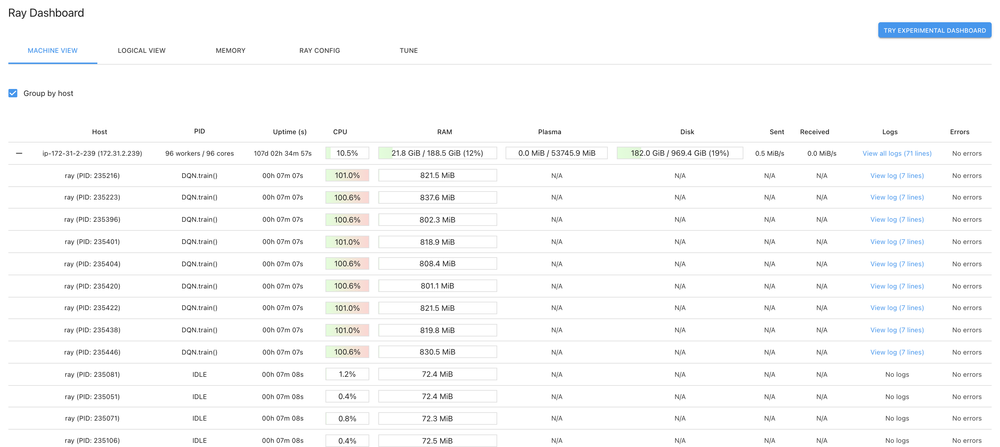

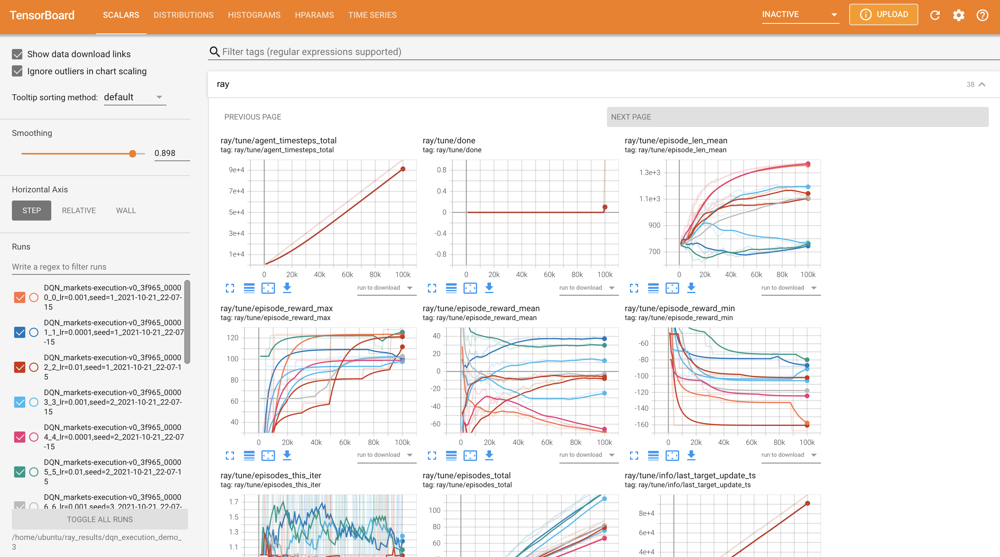

# Test of the algorithm - Rollouts

This part illustrates the implementation of 4 hand-crafted policies and 1 Reinforcement Learning agent learned with RRlib.

## Define or load a policy

In [ ]:
import numpy as np 
np.random.seed(0)
import ray.rllib.agents.dqn as dqn
from ray.tune import Analysis


#each policy needs to have:
# - an attribute name 
# - a method get_action


class policyPassive:
    def __init__(self):
        self.name = 'passive'
        
    def get_action(self, state):
        return 1
        
class policyAggressive:
    def __init__(self):
        self.name = 'aggressive'
        
    def get_action(self, state):
        return 0
    
class policyRandom:
    def __init__(self):
        self.name = 'random'
        
    def get_action(self, state):
        return np.random.choice([0,1])
    
class policyRandomWithNoAction:
    def __init__(self):
        self.name = 'random_no_action'
        
    def get_action(self, state):
        return np.random.choice([0,1, 2])
    
class policyRL:
    """
    policy learned during the training
    get the best policy from training {name_xp}
    Use this policy to compute action
    """
    def __init__(self):
        self.name = 'rl'
        
        ##### LOADING POLICY 
        # cell specific to ray to 
        #this part is to get a path
        # https://github.com/ray-project/ray/issues/4569#issuecomment-480453957
        name_xp = "dqn_execution_daily_test_1" 
        
        data_folder = f"~/ray_results/{name_xp}"
        analysis = Analysis(data_folder)
        trial_dataframes = analysis.trial_dataframes
        trials = list(trial_dataframes.keys())
        best_trial_path = analysis.get_best_logdir(metric='episode_reward_mean', mode='max')
        #can replace by string here - any checkpoint of your choice 
        best_checkpoint = analysis.get_best_checkpoint(trial = best_trial_path, mode='max')
        
        # define the meta parameters of the policy in order to set the trained
        config = dqn.DEFAULT_CONFIG.copy()
        config["framework"]= "torch"
        config["observation_filter"]= "MeanStdFilter"
        config["hiddens"]= [50, 20]
        config["env_config"]= {"background_config":"rmsc04",
                               "timestep_duration":"10S",
                               "order_fixed_size": 50,
                 }

        self.trainer = dqn.DQNTrainer(config=config, env = "markets-daily_investor-v0")
        #load policy from checkpoint
        self.trainer.restore(best_checkpoint)
        
        
    def get_action(self, state):
        return self.trainer.compute_action(state)    
        

## Testing (rollout) infrastructure

**Note**: This part may be included in ABIDES-GYM source code in the future.

In [ ]:
def generate_env(seed):
    """
    generates specific environment with the parameters defined and set the seed
    """
    env = gym.make(
            "markets-daily_investor-v0",
            background_config="rmsc04",
            timestep_duration="10S",
            order_fixed_size= 50,

        )

    env.seed(seed)
    
    return env

In [ ]:
from collections.abc import MutableMapping
import pandas as pd

def flatten_dict(d: MutableMapping, sep: str= '.') -> MutableMapping:
    [flat_dict] = pd.json_normalize(d, sep=sep).to_dict(orient='records')
    return flat_dict

def run_episode(seed = None, policy=None):
    """
    run fully one episode for a given seed and a given policy
    """
    
    env = generate_env(seed)
    state = env.reset()
    done = False
    episode_reward = 0 
    
    while not done:
        action = policy.get_action(state)
        state, reward, done, info = env.step(action)
        print(info)
        episode_reward += reward
    
    #could add a few more... 
    output = flatten_dict(info) 
    output['episode_reward'] = episode_reward
    output['name'] = policy.name
    return output
        
        
    

In [ ]:
from p_tqdm import p_map
import pandas as pd 
from multiprocessing import Pool
from pathos.multiprocessing import ProcessingPool as Pool
#from ray.util.multiprocessing import Pool



def run_N_episode(N):
    """
    run in parallel N episode of testing for the different policies defined in policies list
    heads-up: does not work yet for rllib policies - pickle error
    #https://stackoverflow.com/questions/28821910/how-to-get-around-the-pickling-error-of-python-multiprocessing-without-being-in

    need to run the rllib policies with following cell (not in parralel)
    
    """
    #define policies 
    policies = [policyAggressive(), policyRandom(), policyPassive(), policyRandomWithNoAction()]
    seeds = [i for i in range(N)]
    
    tests = [{"policy":policy, 'seed':seed} for policy in policies for seed in seeds]
    
    def wrap_run_episode(param):
        return run_episode(**param)
    
    outputs = p_map(wrap_run_episode, tests)
    #outputs = Pool().map(wrap_run_episode, tests)
    
    return outputs

N = 50
outputs = run_N_episode(N) 



In [ ]:
#cannot do in parrallel here for now - pickling errors

from tqdm import tqdm
for i in tqdm(range(N)):
    outputs.append(run_episode(seed = i, policy=policyRL()))

## Plotting results

In [ ]:
#convert results in a dataframe with all metrics
df = pd.DataFrame(outputs)
df['ep_len'] = df['action_counter.action_0'] + df['action_counter.action_1'] + df['action_counter.action_2']
df.head()

In [ ]:
#group by policy name and sort
df_g = df.groupby(by='name').mean()

list_interest =  ['episode_reward', 'time_pct', 
               'holdings_pct', 'late_penalty_reward', 
               'imbalance_5', 'spread', 'action_counter.action_0', 'action_counter.action_1',
              'action_counter.action_2']

df_g.sort_values(by = 'episode_reward', ascending=False)[list_interest]

Example of rollout comparison (output of the cell):
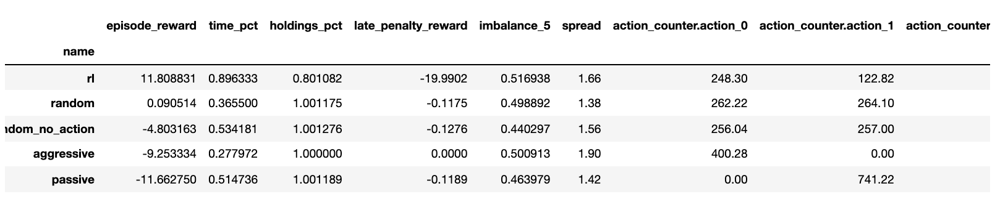

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [ ]:
#distribution plots
for metric in list_interest:
    print(f'======================={metric}========================')
    sns.displot(data = df, x=metric, hue='name', bins=10)
    plt.show()
    sns.displot(data = df, x=metric, hue='name',  kind="kde")
    plt.show()

Example of rollout distribution plots (output of the cell):
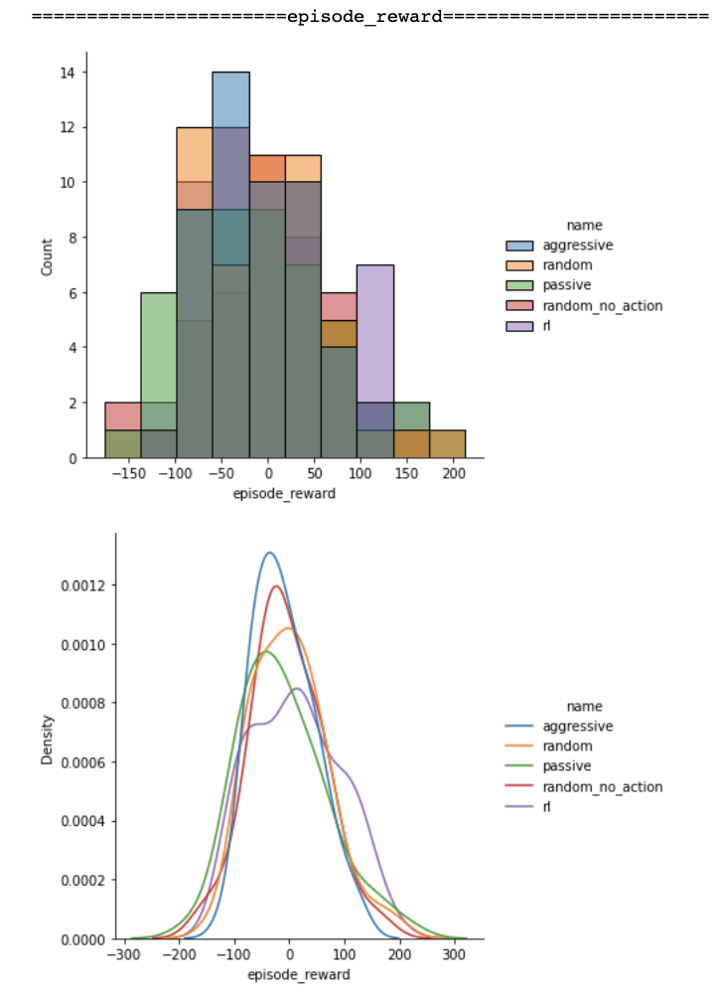

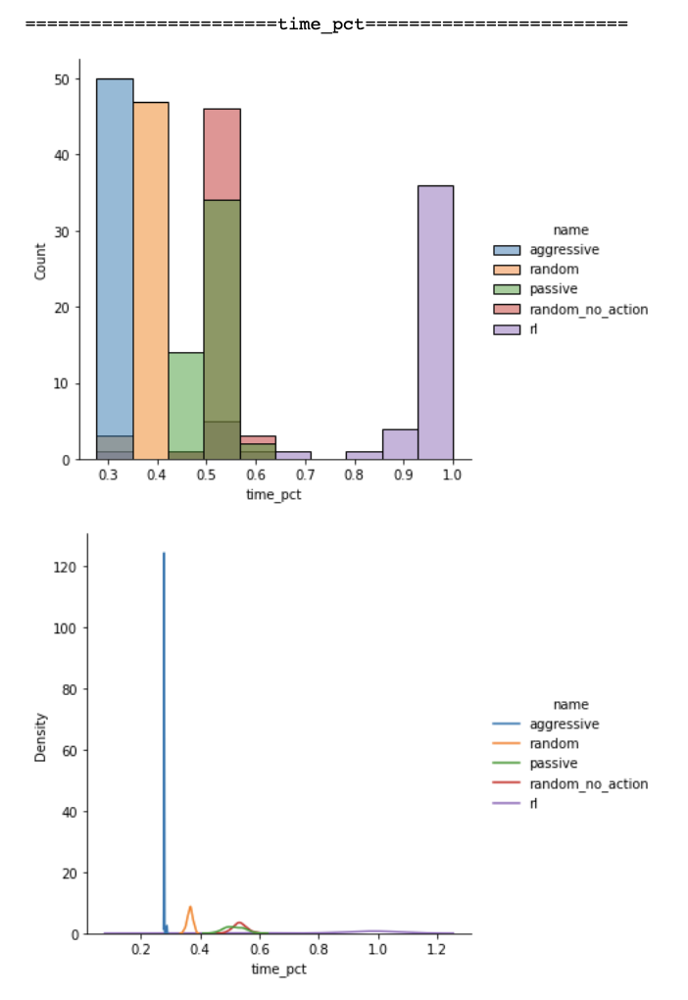

# Future ABIDES-Gym-Markets environment

Plan for ABIDE-Gym environments to offer raw l2 data instead of computed features as state space. 
These new environement will be called markets-XXX-v1.